## Imports

In [1]:
from environment import Environment
from simulated_environment import Simulated_Environment
from agent import Agent

2025-06-19 06:43:19.064418: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-06-19 06:43:19.073709: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750295599.084454  722829 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750295599.087537  722829 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1750295599.096032  722829 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:
from tensorflow.keras.regularizers import l2

## Environment

### Environment Initialization

In [3]:
env=Environment(
    symbol="MSFT",
    short_rate=0.05,
    maturity=4.0,
    steps=1000,
    number_lags=5,
    sma_period=20,
    window=10
)

### Environment Data Inspection

#### First 5 entries of dataset

In [4]:
env.final_data.head()

,Xt,Yt,Xt_returns,Xt_lag1,Yt_lag1,Xt_returns_lag1,Xt_lag2,Yt_lag2,Xt_returns_lag2,Xt_lag3,...,Yt_lag4,Xt_returns_lag4,Xt_lag5,Yt_lag5,Xt_returns_lag5,Xt_momentum,Xt_volatility,Xt_distance,Xt_min,Xt_max
date,,,,,,,,,,,,,,,,,,,,,
2021-07-23,289.67,266.028992,0.012261,286.14,265.975791,0.016704,281.40,265.922602,0.007419,279.32,...,265.816254,-0.013411,280.75,265.763096,-0.000997,0.004134,0.009412,11.9515,265.02,289.67
2021-07-26,289.05,266.082203,-0.002143,289.67,266.028992,0.012261,286.14,265.975791,0.016704,281.40,...,265.869422,0.008304,277.01,265.816254,-0.013411,0.004143,0.009405,10.1300,268.72,289.67
2021-07-27,286.54,266.135425,-0.008722,289.05,266.082203,-0.002143,289.67,266.028992,0.012261,286.14,...,265.922602,0.007419,279.32,265.869422,0.008304,0.001959,0.009624,6.7290,270.90,289.67
2021-07-28,286.22,266.188657,-0.001117,286.54,266.135425,-0.008722,289.05,266.082203,-0.002143,289.67,...,265.975791,0.016704,281.40,265.922602,0.007419,0.001305,0.009584,5.6680,270.90,289.67
2021-07-29,286.50,266.241900,0.000978,286.22,266.188657,-0.001117,286.54,266.135425,-0.008722,289.05,...,266.028992,0.012261,286.14,265.975791,0.016704,0.001928,0.009309,5.1680,271.60,289.67


#### Last 5 entries of Dataset

In [5]:
env.final_data.tail()

,Xt,Yt,Xt_returns,Xt_lag1,Yt_lag1,Xt_returns_lag1,Xt_lag2,Yt_lag2,Xt_returns_lag2,Xt_lag3,...,Yt_lag4,Xt_returns_lag4,Xt_lag5,Yt_lag5,Xt_returns_lag5,Xt_momentum,Xt_volatility,Xt_distance,Xt_min,Xt_max
date,,,,,,,,,,,,,,,,,,,,,
2025-06-12,478.87,323.372625,0.013137,472.62,323.307957,0.003603,470.92,323.243301,-0.003878,472.75,...,323.114030,0.005757,467.68,323.049414,0.008180,0.004308,0.004402,16.8115,450.18,478.87
2025-06-13,474.96,323.437306,-0.008199,478.87,323.372625,0.013137,472.62,323.307957,0.003603,470.92,...,323.178659,0.005026,470.38,323.114030,0.005757,0.003122,0.005928,11.8100,450.18,478.87
2025-06-16,479.14,323.502000,0.008762,474.96,323.437306,-0.008199,478.87,323.372625,0.013137,472.62,...,323.243301,-0.003878,472.75,323.178659,0.005026,0.003649,0.006193,14.7465,450.18,479.14
2025-06-17,478.04,323.566706,-0.002298,479.14,323.502000,0.008762,474.96,323.437306,-0.008199,478.87,...,323.307957,0.003603,470.92,323.243301,-0.003878,0.003203,0.006467,12.6880,450.18,479.14
2025-06-18,480.24,323.631426,0.004592,478.04,323.566706,-0.002298,479.14,323.502000,0.008762,474.96,...,323.372625,0.013137,472.62,323.307957,0.003603,0.003468,0.006464,13.7845,450.18,480.24


#### Dataset Info

In [6]:
env.final_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 981 entries, 2021-07-23 to 2025-06-18
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Xt               981 non-null    float64
 1   Yt               981 non-null    float64
 2   Xt_returns       981 non-null    float64
 3   Xt_lag1          981 non-null    float64
 4   Yt_lag1          981 non-null    float64
 5   Xt_returns_lag1  981 non-null    float64
 6   Xt_lag2          981 non-null    float64
 7   Yt_lag2          981 non-null    float64
 8   Xt_returns_lag2  981 non-null    float64
 9   Xt_lag3          981 non-null    float64
 10  Yt_lag3          981 non-null    float64
 11  Xt_returns_lag3  981 non-null    float64
 12  Xt_lag4          981 non-null    float64
 13  Yt_lag4          981 non-null    float64
 14  Xt_returns_lag4  981 non-null    float64
 15  Xt_lag5          981 non-null    float64
 16  Yt_lag5          981 non-null    float64
 1

#### Dataset Statistics

In [7]:
env.final_data.describe()

,Xt,Yt,Xt_returns,Xt_lag1,Yt_lag1,Xt_returns_lag1,Xt_lag2,Yt_lag2,Xt_returns_lag2,Xt_lag3,...,Yt_lag4,Xt_returns_lag4,Xt_lag5,Yt_lag5,Xt_returns_lag5,Xt_momentum,Xt_volatility,Xt_distance,Xt_min,Xt_max
count,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,...,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000,981.000000
mean,341.525815,293.890931,0.000528,341.327956,293.832158,0.000540,341.127508,293.773398,0.000550,340.923818,...,293.655912,0.000544,340.520076,293.597187,0.000530,0.000536,0.015892,1.862789,324.152870,354.414587
std,69.003438,16.648556,0.017091,68.883461,16.645227,0.017098,68.771244,16.641898,0.017100,68.657880,...,16.635242,0.017103,68.438692,16.631916,0.017098,0.004896,0.006740,12.710962,66.548537,68.561960
min,214.250000,266.028992,-0.080295,214.250000,265.975791,-0.080295,214.250000,265.922602,-0.080295,214.250000,...,265.816254,-0.080295,214.250000,265.763096,-0.080295,-0.013216,0.003126,-40.231500,214.250000,242.580000
25%,284.910000,279.389061,-0.008035,284.910000,279.333189,-0.008035,284.820000,279.277328,-0.008035,284.470000,...,279.165639,-0.008035,284.050000,279.109812,-0.008035,-0.002565,0.010694,-6.965000,272.230000,293.470000
50%,331.620000,293.420078,0.000645,331.320000,293.361400,0.000645,331.210000,293.302733,0.000681,331.160000,...,293.185436,0.000681,330.720000,293.126804,0.000645,0.000621,0.014467,2.114500,316.480000,342.450000
75%,410.540000,308.155737,0.010075,410.540000,308.094112,0.010184,410.370000,308.032499,0.010184,410.340000,...,307.909311,0.010184,409.720000,307.847735,0.010075,0.003818,0.019807,11.030000,395.150000,426.730000
max,480.240000,323.631426,0.096525,479.140000,323.566706,0.096525,479.140000,323.502000,0.096525,478.870000,...,323.372625,0.096525,472.750000,323.307957,0.096525,0.019438,0.038819,51.975000,450.180000,480.240000


#### Correlation in Dataset

In [8]:
env.final_data.corr()

,Xt,Yt,Xt_returns,Xt_lag1,Yt_lag1,Xt_returns_lag1,Xt_lag2,Yt_lag2,Xt_returns_lag2,Xt_lag3,...,Yt_lag4,Xt_returns_lag4,Xt_lag5,Yt_lag5,Xt_returns_lag5,Xt_momentum,Xt_volatility,Xt_distance,Xt_min,Xt_max
Xt,1.000000,0.806882,0.054155,0.996791,0.806882,0.051609,0.993709,0.806882,0.047342,0.990911,...,0.806882,0.044821,0.985700,0.806882,0.045954,0.161121,-0.460825,0.218208,0.975451,0.982957
Yt,0.806882,1.000000,0.021178,0.806144,1.000000,0.019123,0.805477,1.000000,0.018742,0.804834,...,1.000000,0.019423,0.803560,1.000000,0.018240,0.064251,-0.213424,0.093729,0.793918,0.819122
Xt_returns,0.054155,0.021178,1.000000,-0.024203,0.021178,-0.009341,-0.023009,0.021178,-0.066162,-0.018694,...,0.021178,0.007622,-0.015743,0.021178,0.036246,0.320069,0.012658,0.364133,-0.011716,-0.004276
Xt_lag1,0.996791,0.806144,-0.024203,1.000000,0.806144,0.052964,0.996778,0.806144,0.051708,0.993683,...,0.806144,0.044117,0.988299,0.806144,0.043470,0.135740,-0.462027,0.188057,0.977751,0.984573
Yt_lag1,0.806882,1.000000,0.021178,0.806144,1.000000,0.019123,0.805477,1.000000,0.018742,0.804834,...,1.000000,0.019423,0.803560,1.000000,0.018240,0.064251,-0.213424,0.093729,0.793918,0.819122
Xt_returns_lag1,0.051609,0.019123,-0.009341,0.052964,0.019123,1.000000,-0.025554,0.019123,-0.008909,-0.024392,...,0.019123,-0.056454,-0.016400,0.019123,0.007356,0.291403,-0.010869,0.339893,-0.009620,-0.002190
Xt_lag2,0.993709,0.805477,-0.023009,0.996778,0.805477,-0.025554,1.000000,0.805477,0.053028,0.996767,...,0.805477,0.047895,0.990845,0.805477,0.042785,0.112438,-0.461482,0.159989,0.979789,0.985938
Yt_lag2,0.806882,1.000000,0.021178,0.806144,1.000000,0.019123,0.805477,1.000000,0.018742,0.804834,...,1.000000,0.019423,0.803560,1.000000,0.018240,0.064251,-0.213424,0.093729,0.793918,0.819122
Xt_returns_lag2,0.047342,0.018742,-0.066162,0.051708,0.018742,-0.008909,0.053028,0.018742,1.000000,-0.025621,...,0.018742,-0.066217,-0.020135,0.018742,-0.056378,0.281039,-0.017249,0.300641,-0.006397,0.000860
Xt_lag3,0.990911,0.804834,-0.018694,0.993683,0.804834,-0.024392,0.996767,0.804834,-0.025621,1.000000,...,0.804834,0.052286,0.993641,0.804834,0.046556,0.089720,-0.460618,0.134802,0.981561,0.987025


### Environment State

In [9]:
state=env.get_state()

#### State First Element: (Timeseries data for Xt and Yt)

In [10]:
state[0]

[(280.75, 265.7630958486989),
 (277.01, 265.81625378348497),
 (279.32, 265.8694223509212),
 (281.4, 265.9226015531343),
 (286.14, 265.9757913922516),
 (289.67, 266.0289918704005)]

#### State Second Element: (Timeseries data for Xt returns)

In [11]:
state[1]

[[-0.0009968315824189983],
 [-0.013410986999810052],
 [0.008304471359091953],
 [0.007419066702454039],
 [0.0167040568578994],
 [0.012261142472745878]]

#### State Third Element: (Current value of xt and yt along with thier portfolio weights)

In [12]:
state[2]

[289.67, 266.0289918704005, 0, 0]

#### State Fourth Element: (Distance,Min_val,Max_Val,Momentum,Volatility of Risky asset Xt)

In [13]:
state[3]

[11.95150000000001,
 265.02,
 289.67,
 0.0041337080952497975,
 0.009412261604681938]

### Environment Plots

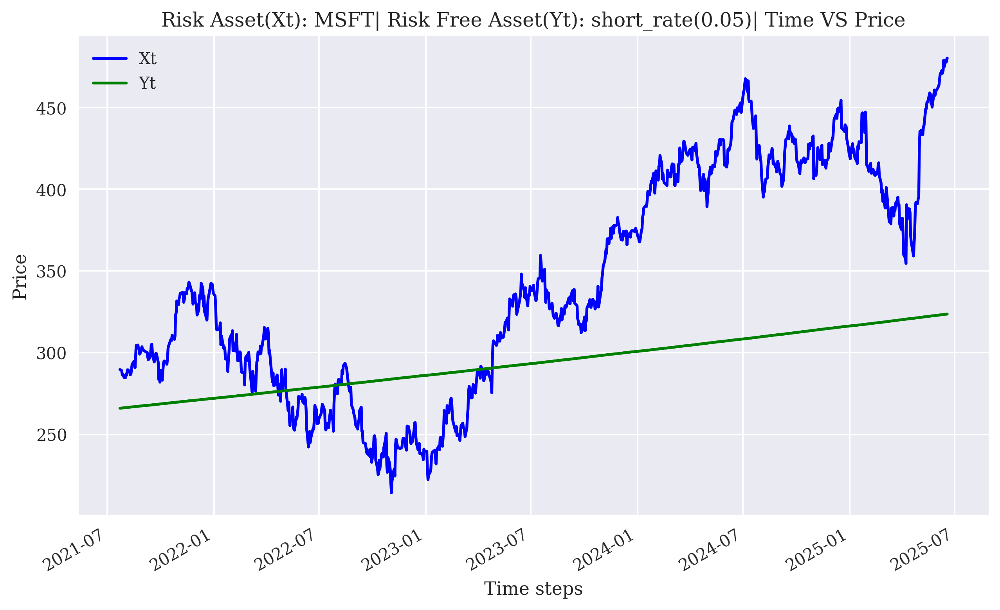

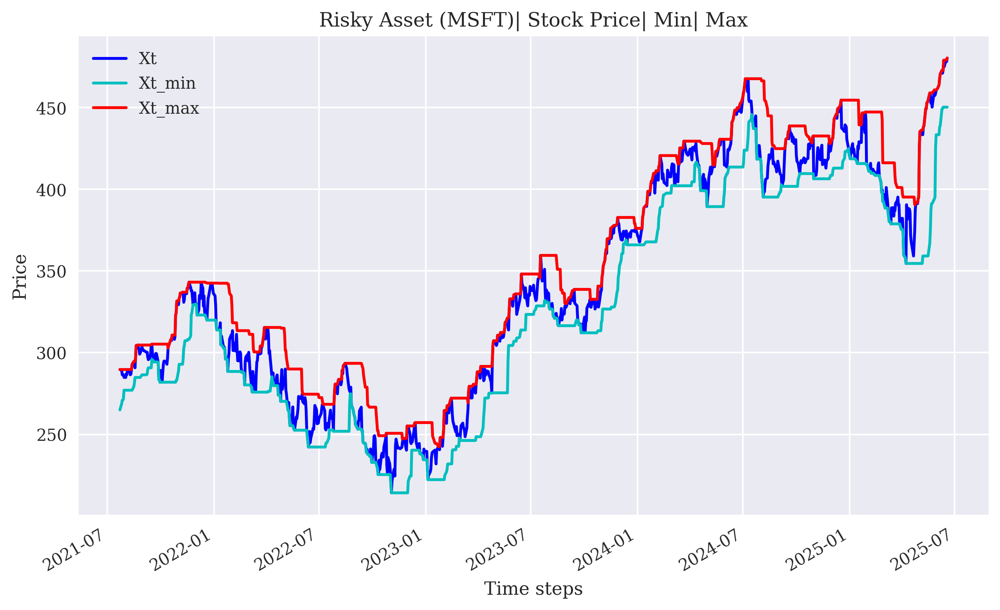

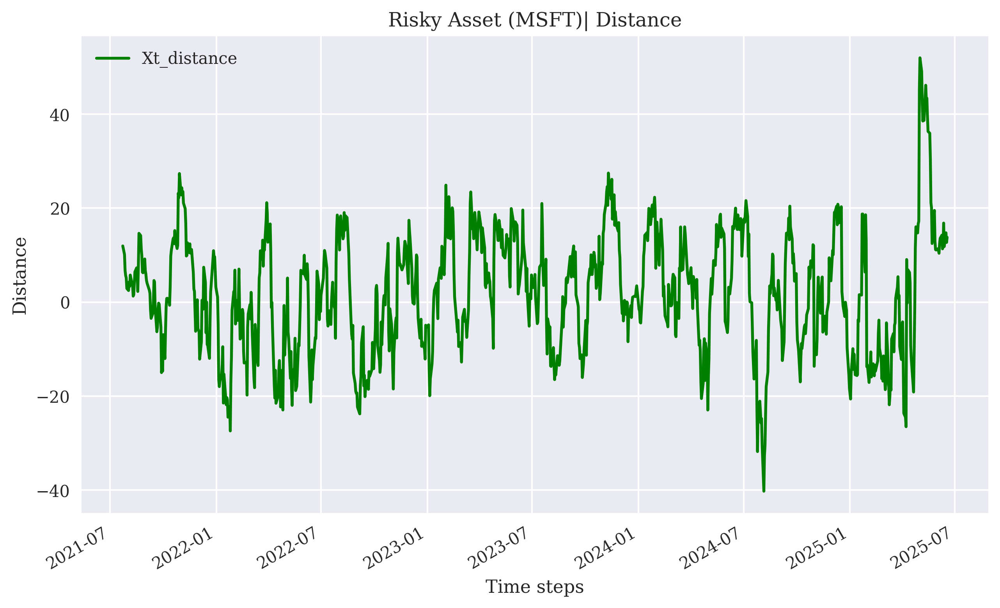

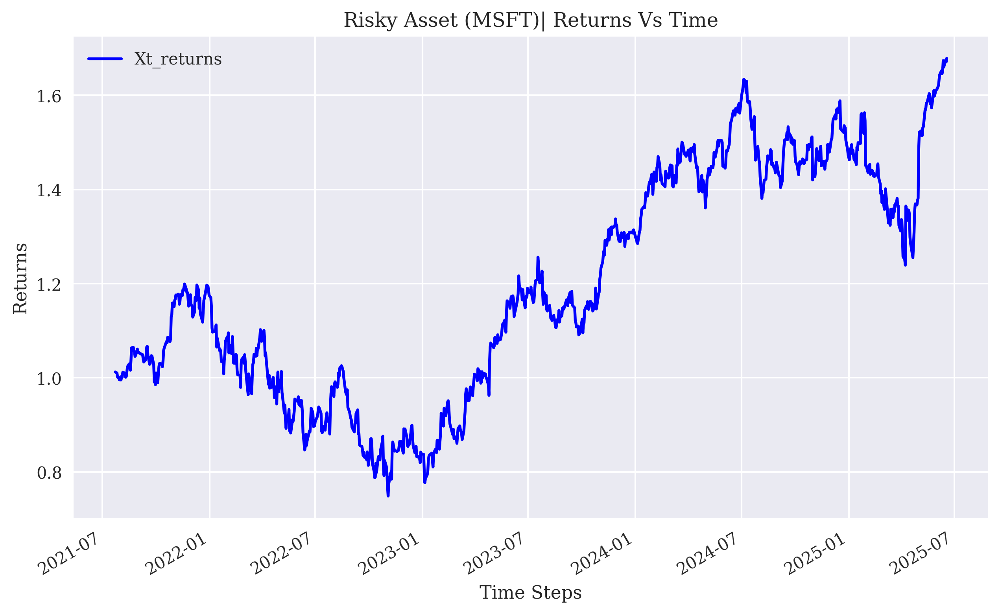

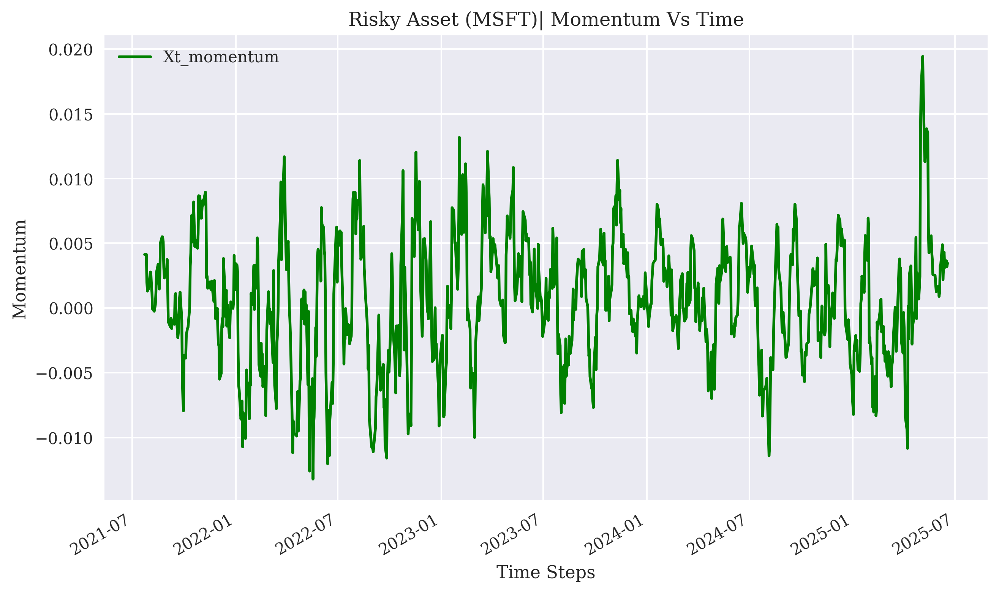

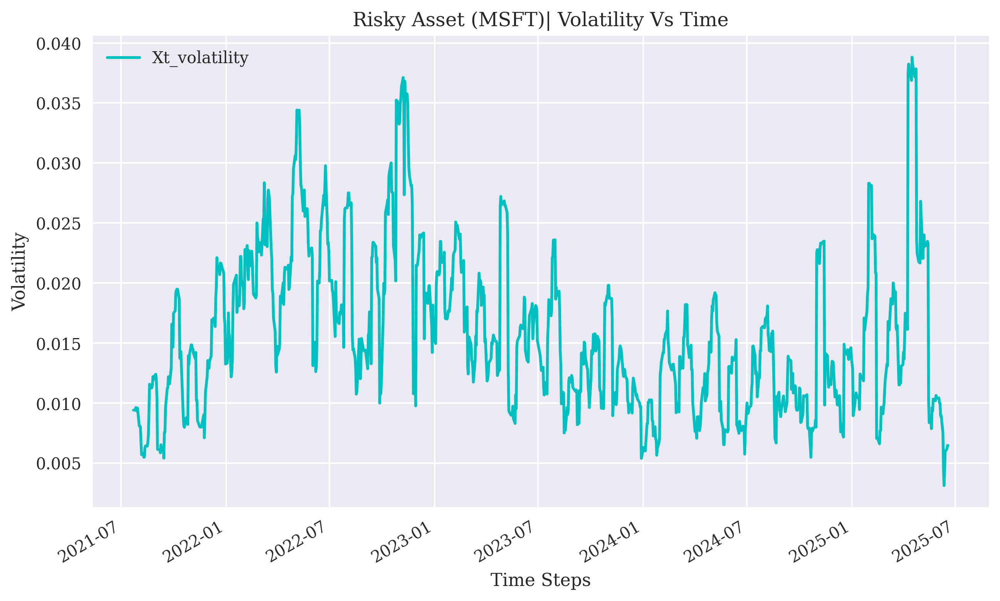

In [14]:
env.plots()

## Simulated Environement

### Initialization

In [15]:
simulated_env=Simulated_Environment(
    initial_value=100.0,
    short_rate=[0.05,0.0025,0.07],
    index_drift=[0.05,0.1,0.15],
    index_volatility=[0.1,0.2,0.3],
    maturity=4.0,
    steps=1000,
    number_lags=5,
    sma_period=20,
    window=10
    
)

### Plots

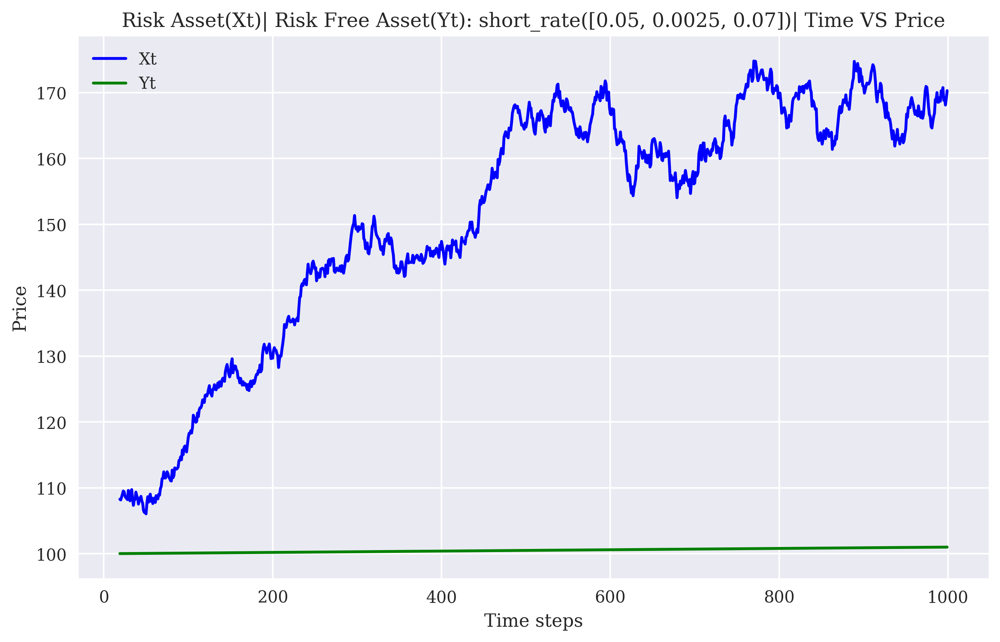

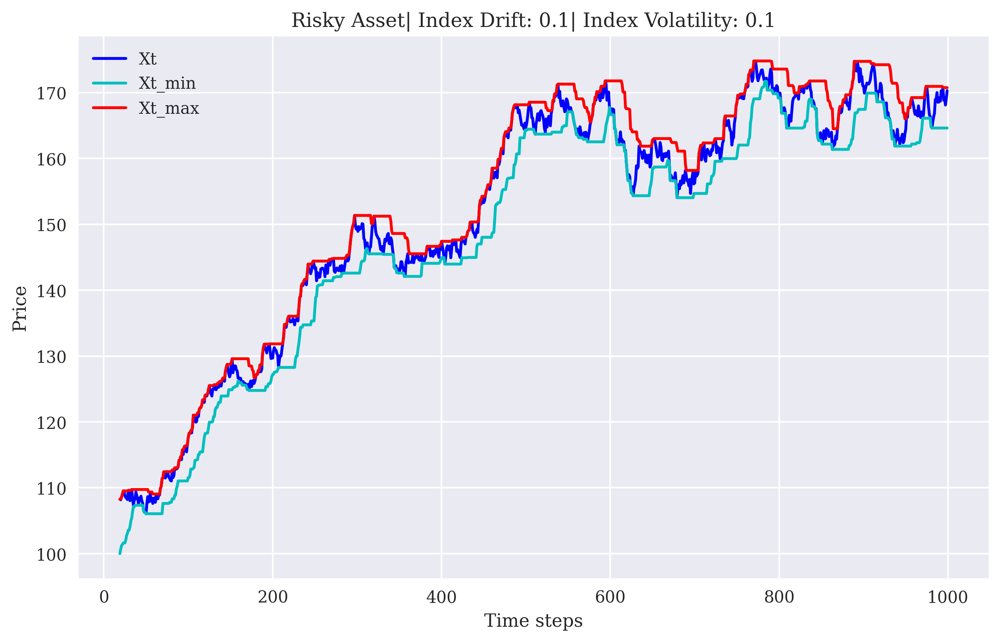

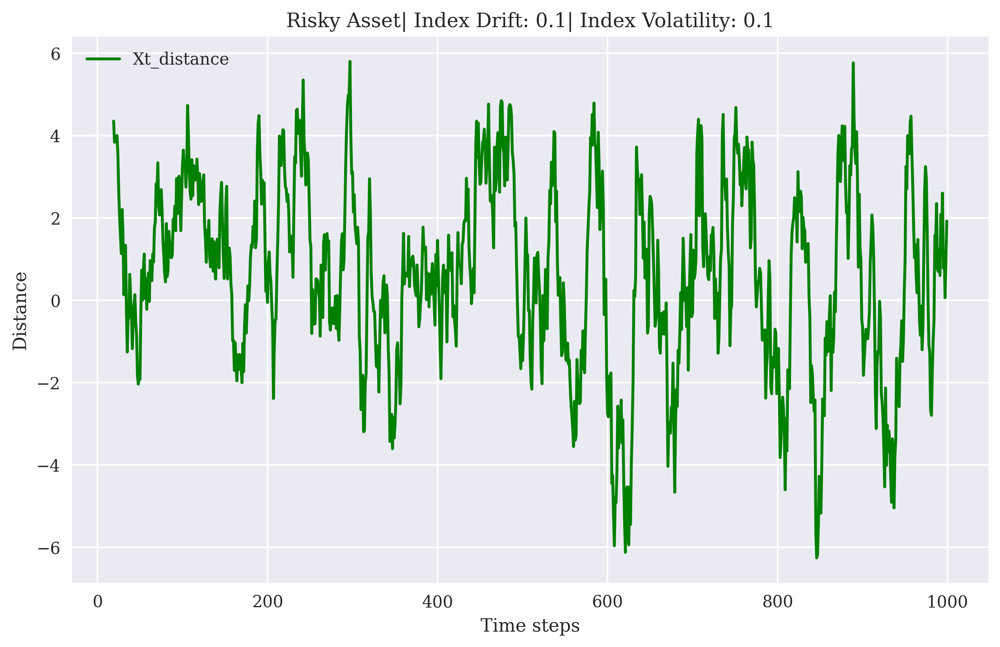

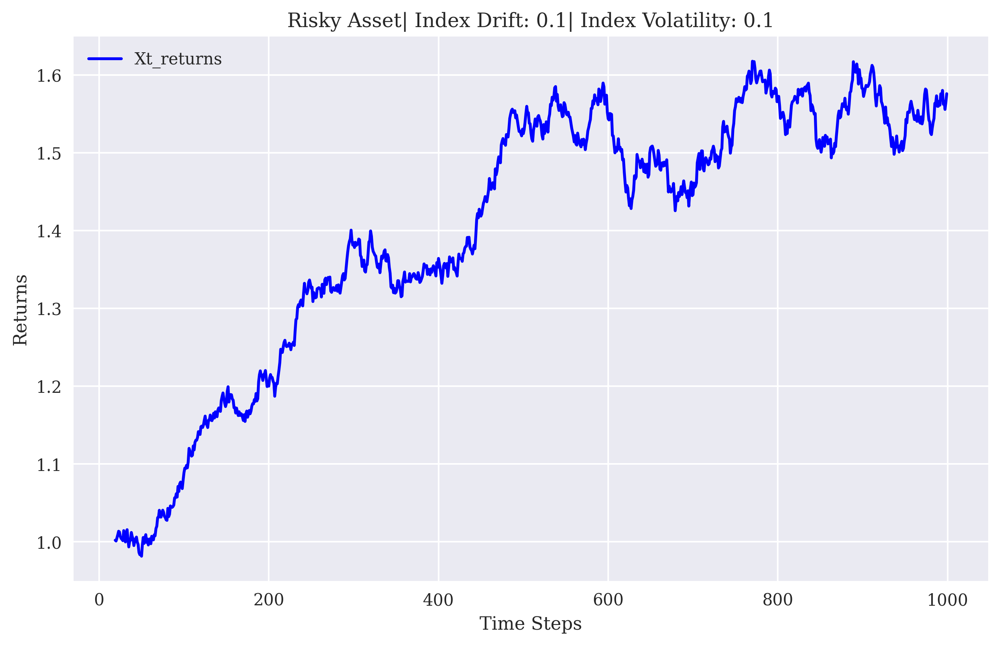

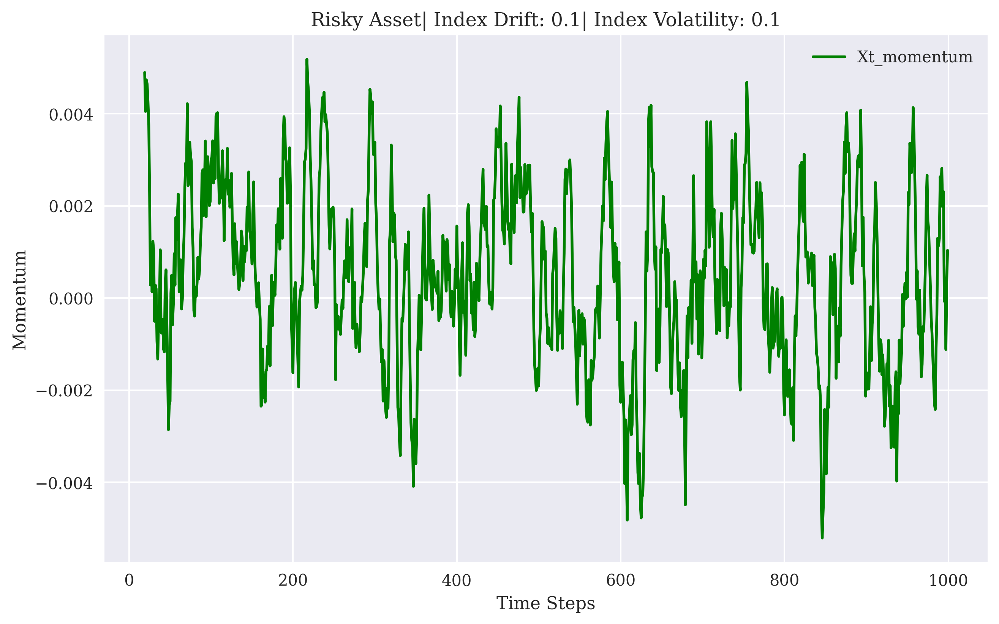

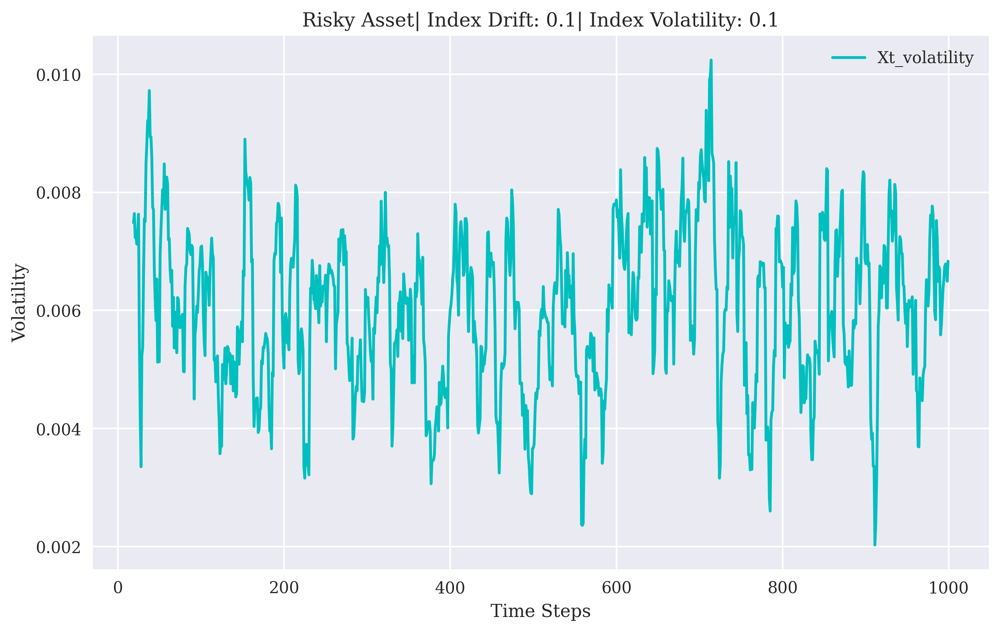

In [16]:
simulated_env.plots()

## Agent

### Model Config

In [17]:
model_config={
    "Model_1":[
        {
            "units":8,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None,
            "return_sequences":True
        },
        {
            "units":16,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None,
            "return_sequences":True
        },
        {
            "units":32,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None,
            "return_sequences":False
        }
    ],

    "Model_2":[
        {
            "units":4,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None,
            "return_sequences":True
        },
        {
            "units":8,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None,
            "return_sequences":True
        },
        {
            "units":16,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None,
            "return_sequences":False
        }
    ],

    "Model_3":[
        {
            "units":8,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None
        },

        {
            "units":16,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None
        },
        {
            "units":32,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None
        }
        
    ],

    "Model_4":[
        {
            "units":8,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None
        },

        {
            "units":16,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None
        },
        {
            "units":32,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None
        }
        
    ],

    "Final_Model":[
        {
            "units":128,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None
        },
        {
            "units":256,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None
        },
        {
            "units":64,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None
        },

        {
            "units":16,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":l2(0.007)
        },

        {
            "units":8,
            "activation":"relu",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None
        },

        {
            "units":1,
            "activation":"linear",
            "kernel_initializer":"he_uniform",
            "kernel_regularizer":None
        }
        
    ]
    
}

### Optimizer Config

In [18]:
optimizer_config={
    "learning_rate":0.001,
    "beta_1":0.96,
    "beta_2":0.98
}

### Agent Initialization

In [19]:
agent=Agent(
    env=env,
    model_config=model_config,
    optimizer_config=optimizer_config,
    batch_size=128,
    buffer_size=2000,
    gamma=0.7,
    epsilon=1.0,
    epsilon_min=0.1,
    epsilon_decay=0.9975
    
)

2025-06-19 06:43:31.563235: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


### Model Architecture

In [20]:
agent.get_model_architecture()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 6, 2)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_1       │ (None, 6, 1)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 4)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_3       │ (None, 5)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 6, 8)      │        352 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_3 (LSTM)       │ (None, 6, 4)      │         96 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 8)         │         40 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 8)         │         48 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ (None, 6, 16)     │      1,600 │ lstm[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_4 (LSTM)       │ (None, 6, 8)      │        416 │ lstm_3[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 16)        │        144 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 16)        │        144 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ (None, 32)        │      6,272 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_5 (LSTM)       │ (None, 16)        │      1,600 │ lstm_4[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 32)        │        544 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 32)        │        544 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 112)       │          0 │ lstm_2[0][0],     │
│ (Concatenate)       │                   │            │ lstm_5[0][0],     │
│                     │                   │            │ dense_2[0][0],    │
│                     │                   │            │ dense_5[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 128)       │     14,464 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 256)       │     33,024 │ dense_6[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 64)        │     16,448 │ dense_7[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 16)        │      1,040 │ dense_8[0][0]     │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 76,921 (300.47 KB)

 Trainable params: 76,921 (300.47 KB)

 Non-trainable params: 0 (0.00 B)

### Agent Training

In [21]:
agent.train_agent(
    episodes=50,
    steps_per_episode=2,
    training_version="1_o"
)

Episode : 10/50| Reward: 131.8242531452467| Risky Asset weight: 0.21943475235057885| MSE:23.003828048706055| Epsilon: 0.9752793831785673
Episode : 20/50| Reward: 246.69971158564846| Risky Asset weight: 0.45683852127637237| MSE:25.595687866210938| Epsilon: 0.9511698752531668
Episode : 30/50| Reward: 192.4447960187672| Risky Asset weight: 0.7640781745150268| MSE:14.841317176818848| Epsilon: 0.9276563692349432
Episode : 40/50| Reward: 173.93591971259656| Risky Asset weight: 0.851877094464652| MSE:13.885897636413574| Epsilon: 0.9047241315891249
Episode : 50/50| Reward: 105.53451937607872| Risky Asset weight: 0.2786235034351575| MSE:10.545917510986328| Epsilon: 0.8823587930030068
Training Agent completed...
Model saved at : /home/spiralmonster/Projects/ReinforcementLearningForFinance/DynamicAssetAllocation/TwoAsset/Models/model_version_1_o.keras


### Training Plots

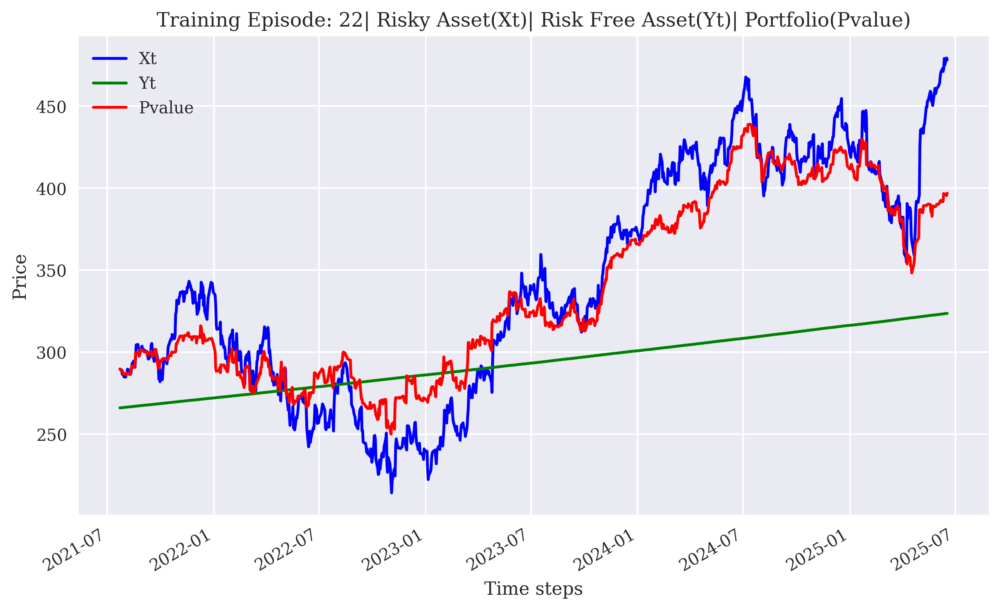

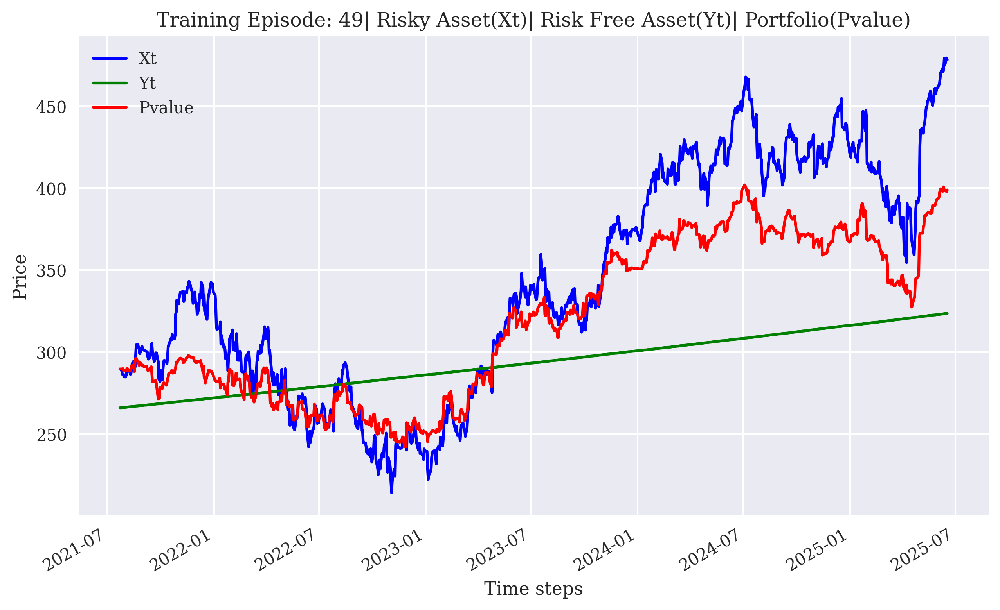

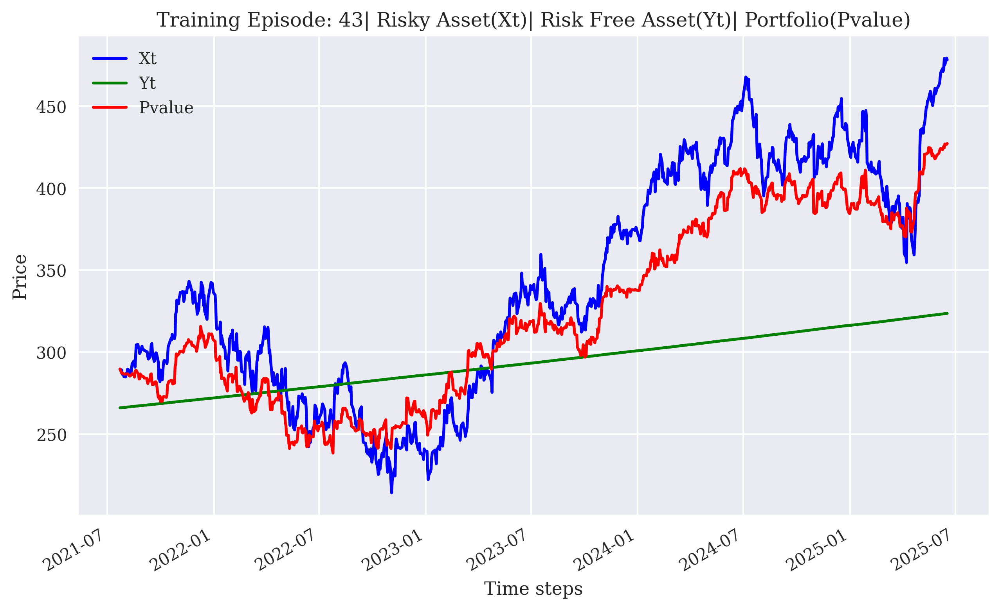

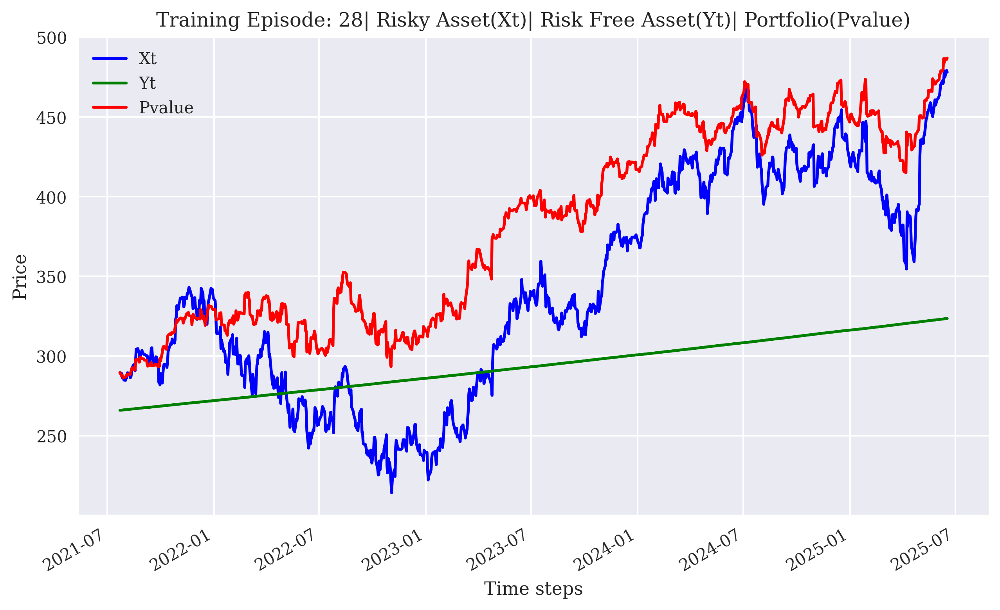

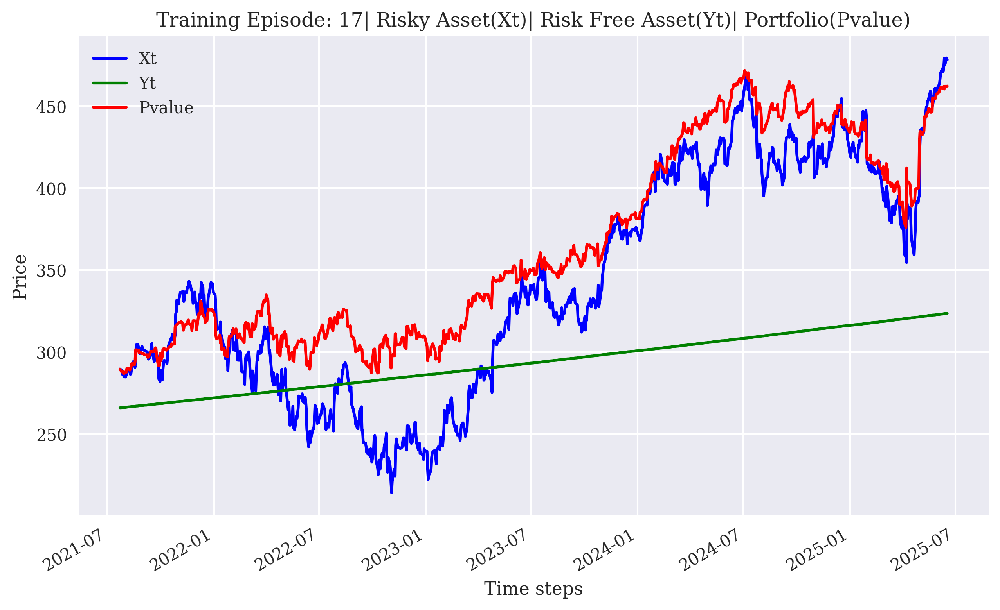

...

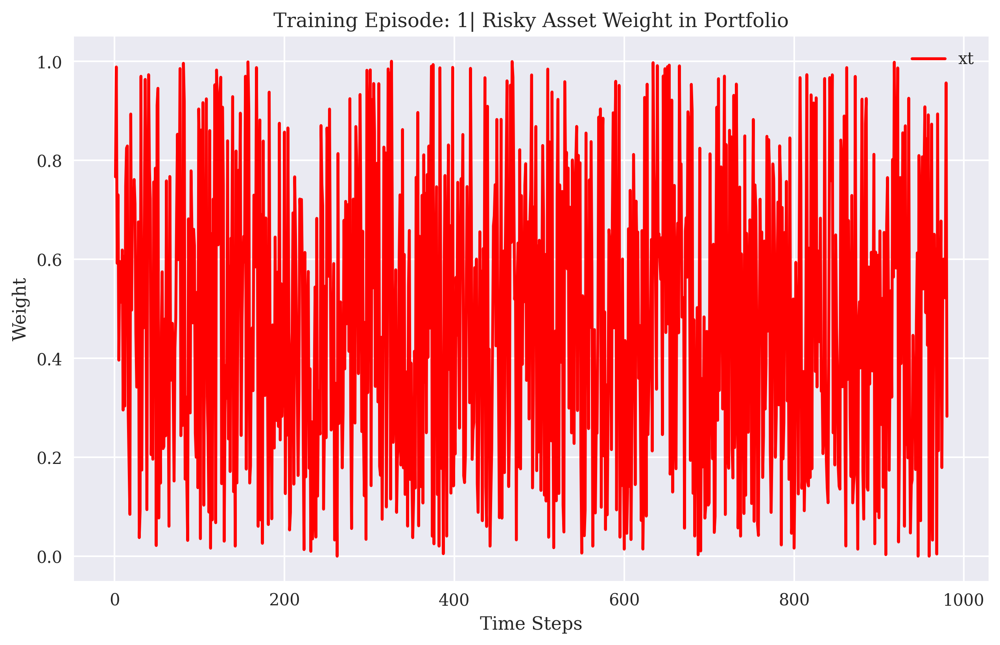

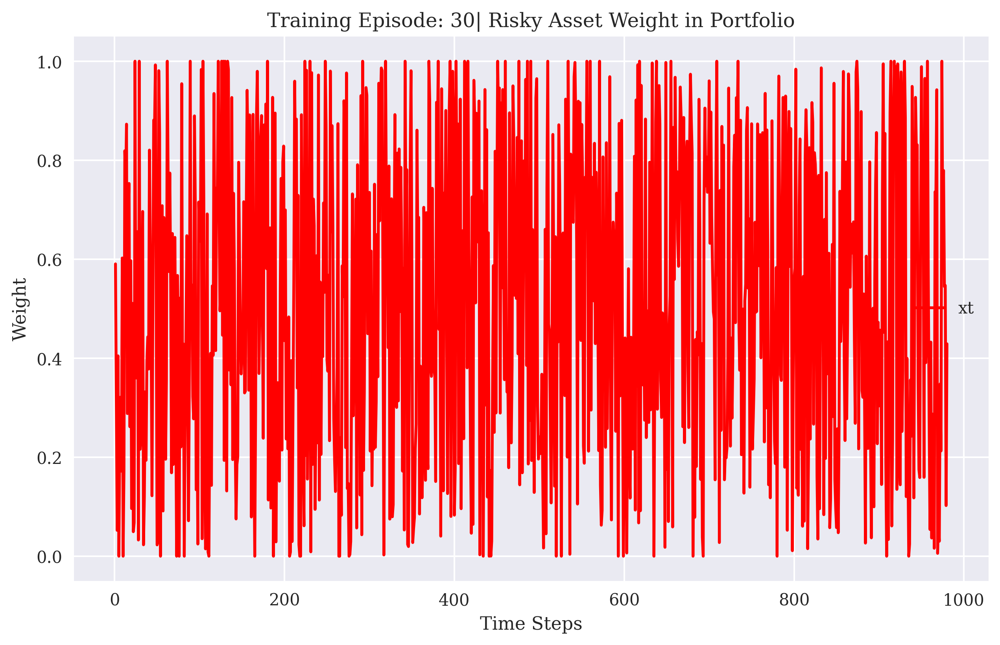

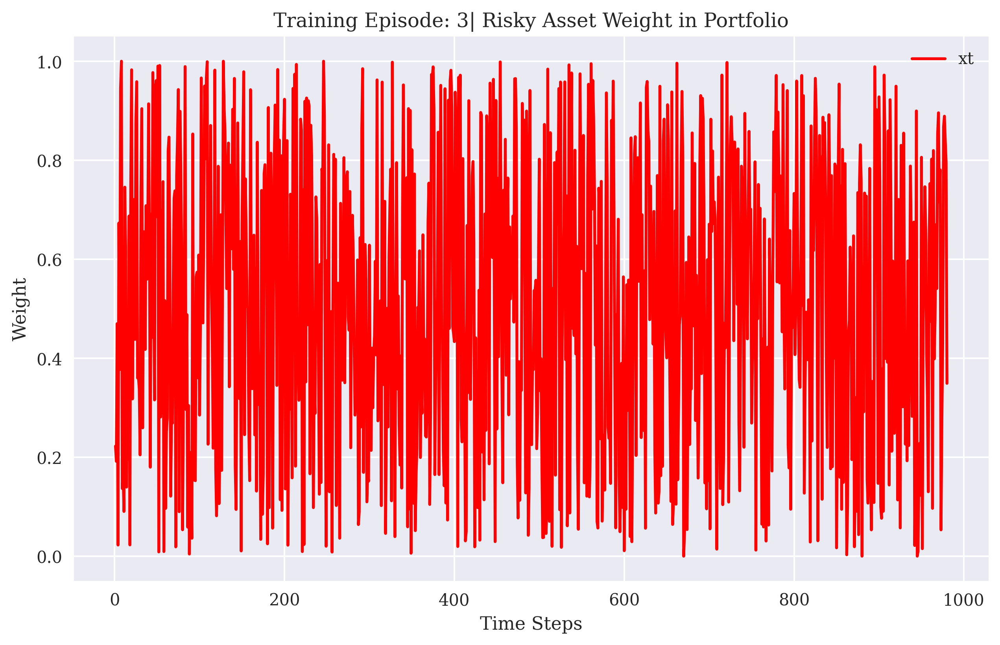

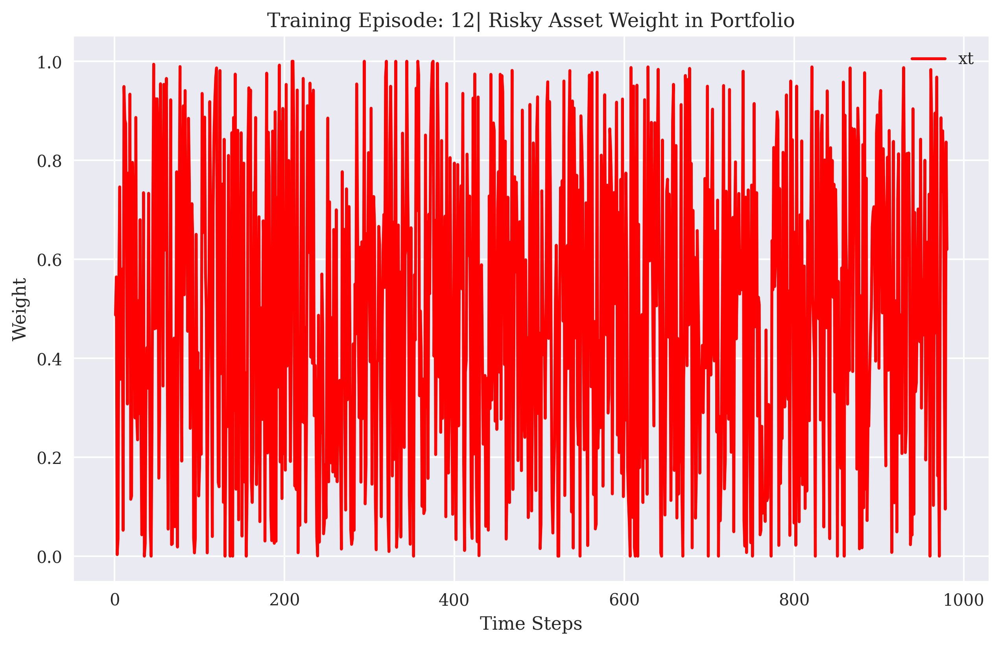

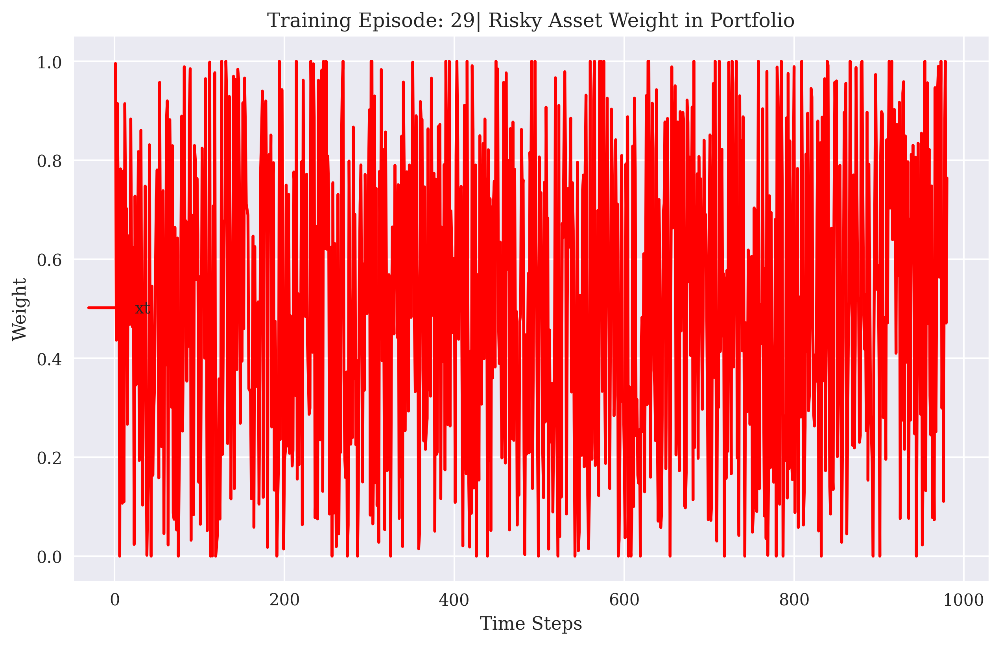

In [22]:
agent.training_plots()

### Training Episode Plots

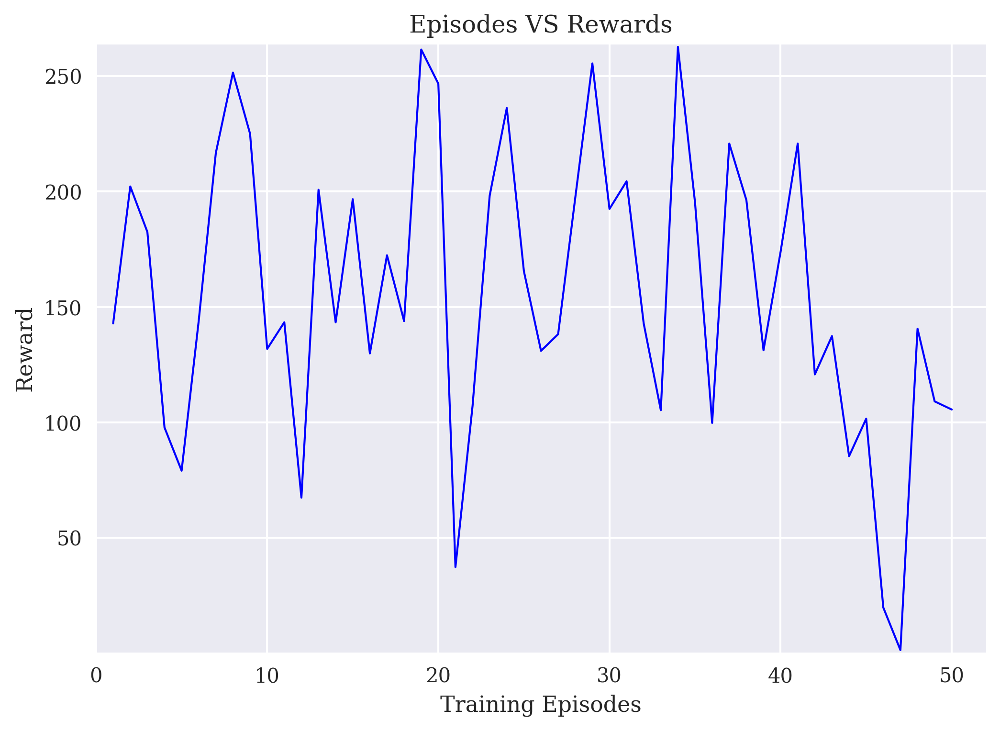

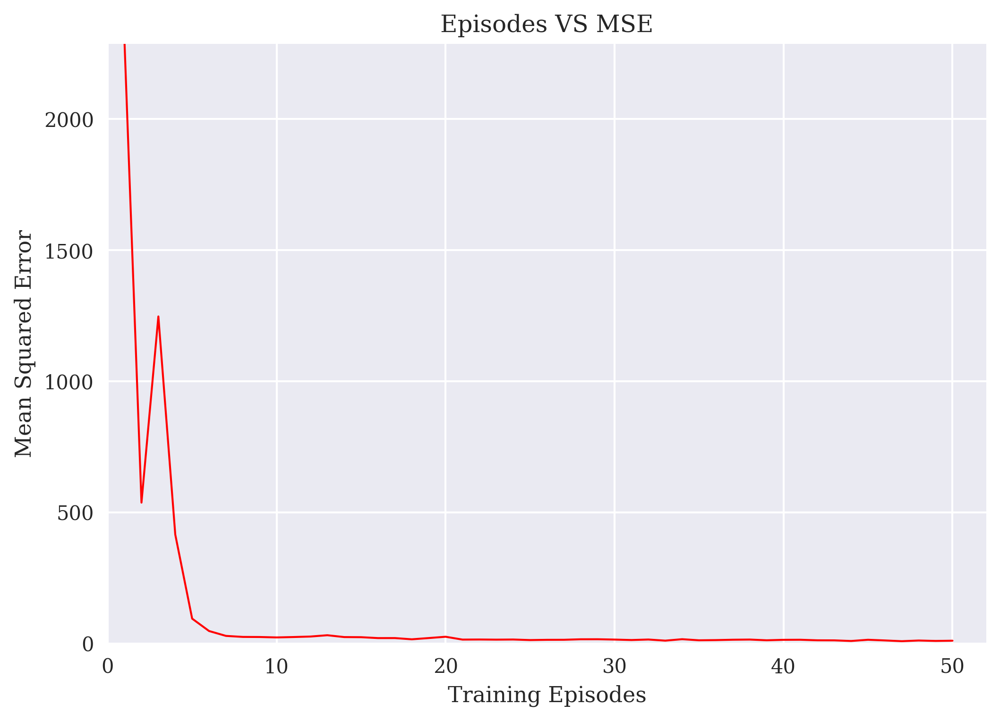

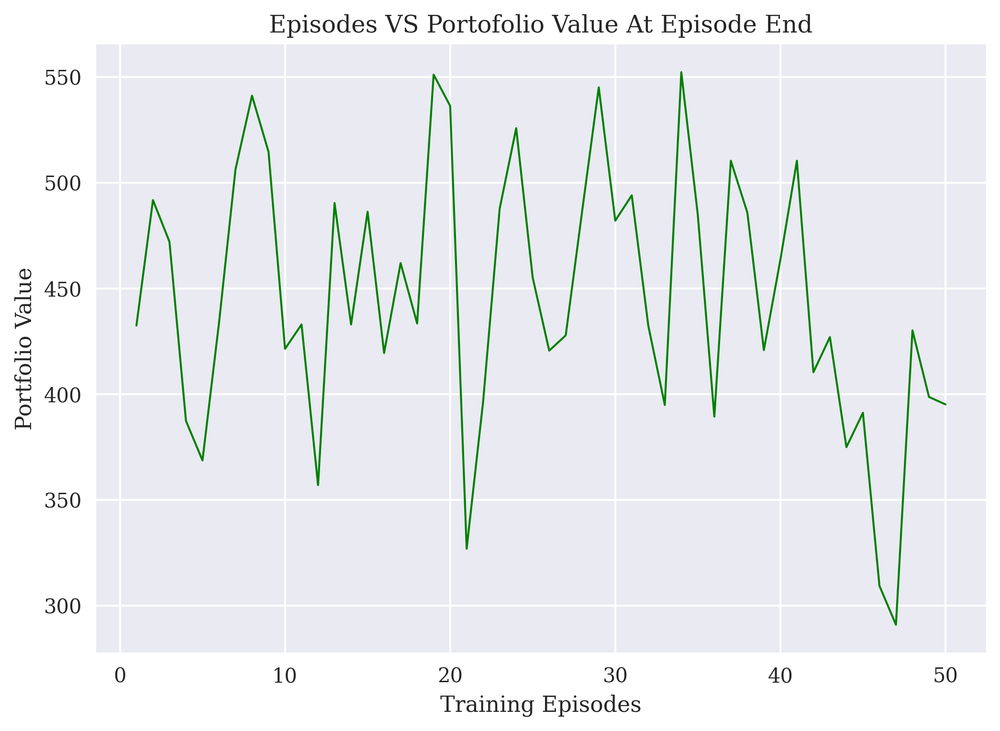

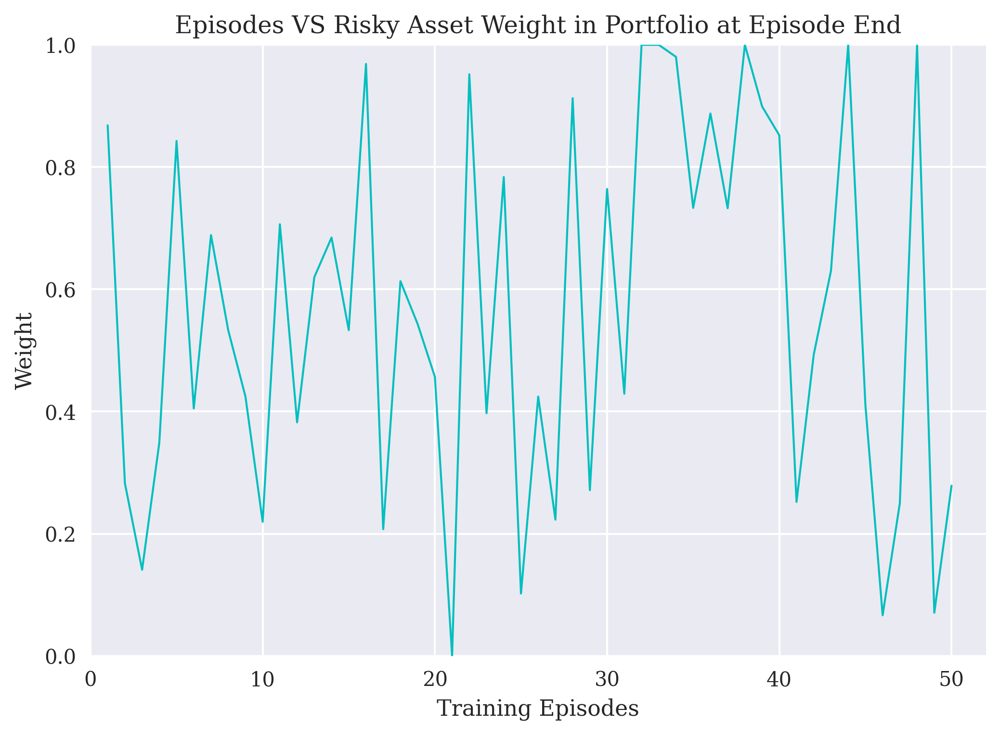

In [23]:
agent.episode_plots()